# Project Description

In this Project I have used data from https://www.kaggle.com/arashnic/ctr-in-advertisement . 
<br>

My main goal in the project is to produce insights about what are good online ads, how to improve them, what make an ad succeed and more.

Table of Contents:

1. [Imports and first look at the data](#Imports-and-first-look-at-the-data)
2. [Preprocessing](#Preprocessing)
3. [EDA](#EDA)
4. [Testing Hypothesis](#Testing-Hypothesis)
5. [Final Conclusion](#Final-Conclusion)

## Imports and first look at the data

In [1]:
#imports

import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pdpr
from scipy import stats as st

%matplotlib inline

In [2]:
#writing path to data
path= r'path\Ad_click_prediction_train.csv'

In [3]:
#loading data
ads = pd.read_csv(path)

In [4]:
#looking at the data info
ads.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 463291 entries, 0 to 463290
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   session_id              463291 non-null  int64  
 1   DateTime                463291 non-null  object 
 2   user_id                 463291 non-null  int64  
 3   product                 463291 non-null  object 
 4   campaign_id             463291 non-null  int64  
 5   webpage_id              463291 non-null  int64  
 6   product_category_1      463291 non-null  int64  
 7   product_category_2      97437 non-null   float64
 8   user_group_id           445048 non-null  float64
 9   gender                  445048 non-null  object 
 10  age_level               445048 non-null  float64
 11  user_depth              445048 non-null  float64
 12  city_development_index  338162 non-null  float64
 13  var_1                   463291 non-null  int64  
 14  is_click            

In [5]:
#checking the data
ads.head()

,session_id,DateTime,user_id,product,campaign_id,webpage_id,product_category_1,product_category_2,user_group_id,gender,age_level,user_depth,city_development_index,var_1,is_click
0,140690,2017-07-02 00:00,858557,C,359520,13787,4,NaN,10.0,Female,4.0,3.0,3.0,0,0
1,333291,2017-07-02 00:00,243253,C,105960,11085,5,NaN,8.0,Female,2.0,2.0,NaN,0,0
2,129781,2017-07-02 00:00,243253,C,359520,13787,4,NaN,8.0,Female,2.0,2.0,NaN,0,0
3,464848,2017-07-02 00:00,1097446,I,359520,13787,3,NaN,3.0,Male,3.0,3.0,2.0,1,0
4,90569,2017-07-02 00:01,663656,C,405490,60305,3,NaN,2.0,Male,2.0,3.0,2.0,1,0


In [6]:
#producing a proflie report
pdpr.ProfileReport(ads)

## Preprocessing

In [7]:
#missing values

#according to the pandas profiling report we have around 18000 rows missing in few field.
#we can understnad that these are probably missing in the same rows.
#after checking i saw that it is as i thought because there is not way to fill them we have to drop them.

ads = ads.drop(ads.loc[ads['user_depth'].isna()].index)

#If possible i would have checked infront of the engineers team if we had a problem while collecting some of the data
#but as this is impossible  we can not fill 'is_click' therefore we must drop it

ads = ads.drop(ads.loc[ads['is_click'].isna()].index)

In [8]:
#changing index to lowercaps

ads.columns = ads.columns.str.lower()

In [9]:
#changing data types

ads['session_id'] = ads['session_id'].astype('int32')
ads['datetime'] = pd.to_datetime(ads['datetime'])
ads['user_id'] = ads['user_id'].astype('int32')
ads['campaign_id'] = ads['campaign_id'].astype('int32')
ads['webpage_id'] = ads['webpage_id'].astype('int32')
ads['product_category_1'] = ads['product_category_1'].astype('category')
ads['product_category_2'] = ads['product_category_2'].astype('category')
ads['user_group_id'] = ads['user_group_id'].astype('int16')
ads['gender'] = ads['gender'].astype('category')
ads['age_level'] = ads['age_level'].astype('int16')
ads['user_depth'] = ads['user_depth'].astype('int16')
ads['is_click'] = ads['is_click'].astype('int16')

#after checking using value counts i saw there are only single characters in the product column 
ads['product'] = ads['product'].astype('category')

In [10]:
#looking at the data info after changes
ads.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 445048 entries, 0 to 463290
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   session_id              445048 non-null  int32         
 1   datetime                445048 non-null  datetime64[ns]
 2   user_id                 445048 non-null  int32         
 3   product                 445048 non-null  category      
 4   campaign_id             445048 non-null  int32         
 5   webpage_id              445048 non-null  int32         
 6   product_category_1      445048 non-null  category      
 7   product_category_2      93669 non-null   category      
 8   user_group_id           445048 non-null  int16         
 9   gender                  445048 non-null  category      
 10  age_level               445048 non-null  int16         
 11  user_depth              445048 non-null  int16         
 12  city_development_index  338162

##### Memory usage dropped from 126MB to 25MB

In [11]:
#checking for duplicates
ads.loc[ads.duplicated()]

,session_id,datetime,user_id,product,campaign_id,webpage_id,product_category_1,product_category_2,user_group_id,gender,age_level,user_depth,city_development_index,var_1,is_click


In [12]:
#adding date and time data
# the data is from only 1 week no need for year/month/week columns

ads['date'] = ads['datetime'].dt.date
ads['hour'] = ads['datetime'].dt.hour

## EDA

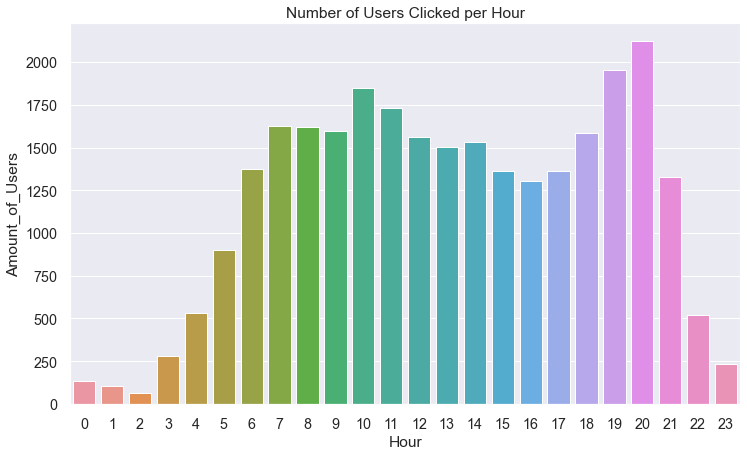

In [13]:
#checking if there are certain hours that people click more 

ads_click = ads.loc[ads['is_click']==1]
ads_no_click = ads.loc[ads['is_click']==0]

ads_time = ads_click.pivot_table(index='hour',values='user_id',aggfunc='nunique').drop('hour',axis=1).reset_index()
ads_time.columns = ['Hour','Amount_of_Users']

#plotting
plt.figure(figsize=(12,7))
sns.set(font_scale=1.3)
fig = sns.barplot(data=ads_time,x='Hour',y='Amount_of_Users').set_title('Number of Users Clicked per Hour')
plt.show()

#### Conclusion

We have 2 peaks at the number of users clicked, between 10:00 - 11:00 and between 19:00 - 20:00.
My hypothesis is that the peak in the morning hours is due to people having small breaks during the work/starting to get ready for their lunch. The peak in the evening hours might be because most people are at home by that time and have more free time (this hypothesis get a slight boost from the fact that between 15:00 - 17:00 we see a drop in the number of clicks as these are usually the hours that people start heading home from work and can not use technology with ads)

At 21:00 There is another drop, this might be because people prefer to plug off or be with their family and friends after they have spend some time on their phones/comupters (19:00 - 20:00).

In [14]:
# Discovering which gender click more ads

#getting the number of users per gender
ads_gender_all = ads.pivot_table(index='gender',values='user_id',aggfunc='nunique').drop('gender',axis=1).reset_index()
ads_gender_all.columns =['Gender','total_users']

#getting the numbers of users clicked per gender
ads_gender_click = ads_click.pivot_table(index='gender',values='user_id',aggfunc='nunique').drop('gender',axis=1).reset_index()
ads_gender_click.columns =['Gender','clicked']

In [15]:
#merging and calculating %
ads_gender_click = ads_gender_click.merge(ads_gender_all,how='outer',on='Gender')

ads_gender_click['Precentage_of_Clicks'] = (ads_gender_click['clicked']/ads_gender_click['total_users'])*100

In [16]:
#plotting
px.bar(data_frame = ads_gender_click,x='Gender',y='Precentage_of_Clicks')

#### Conclusion

There is a small difference between the gender the click on ads. Males slightly tend to click more ads (15.99% VS 17.04%) 

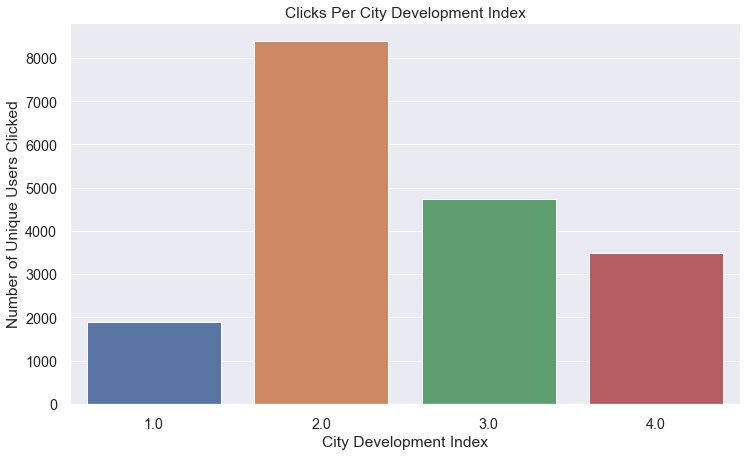

In [17]:
#checking if certain city development level have more clicks

ads_city_dev = ads_click.pivot_table(index='city_development_index',values='user_id',aggfunc='nunique').drop('city_development_index',axis=1).reset_index()
ads_city_dev.columns = ['City Development Index','Number of Unique Users Clicked']

#plotting
plt.figure(figsize=(12,7))
sns.barplot(data=ads_city_dev,x='City Development Index',y='Number of Unique Users Clicked').set_title('Clicks Per City Development Index')
plt.show()

#### Conclusion

There is diffrence in the number of clicks in each City Development level. Best to Worst City Index:

1. City Index 2
2. City Index 3
3. City Index 4
4. City Index 1




We should probably focus our marketing efforts on Cities in level 2 and then 3 of the Development Index as these may get us the best results.

In [18]:
#Best and Worst webpages

#getting webpages and the number of times users didnt click
webpages_no_click = ads_no_click.pivot_table(index='webpage_id',values='is_click',aggfunc='count').reset_index()
webpages_no_click.columns = ['webpage_id','num_of_no_clicks']

#getting webpages and the number of times users clicked
webpages_click = ads_click.pivot_table(index='webpage_id',values='is_click',aggfunc='count').reset_index()
webpages_click.columns = ['webpage_id','num_of_clicks']

#merging and calculating CTR
webpages = pd.merge(webpages_click,webpages_no_click,on='webpage_id',how='outer')

webpages['CTR'] = (webpages['num_of_clicks']/webpages['num_of_no_clicks'])*100

webpages = webpages.sort_values(by='CTR',ascending=False).reset_index()
webpages = webpages.drop('index',axis=1)

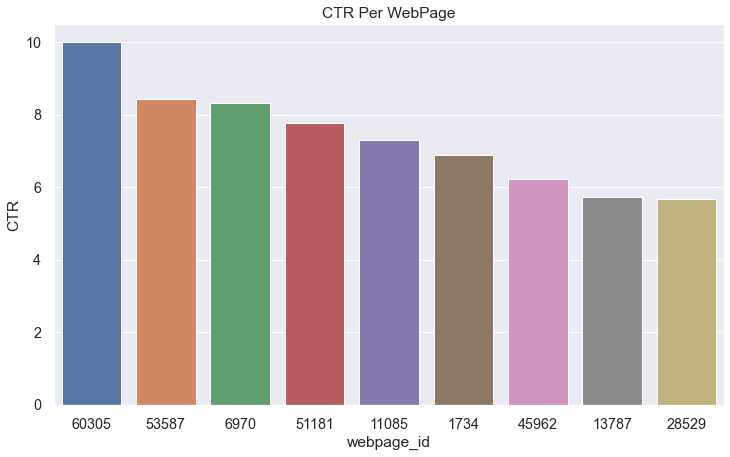

In [19]:
#plotting
plt.figure(figsize=(12,7))
sns.set(font_scale=1.3)
fig = sns.barplot(data=webpages,x='webpage_id',y='CTR',order=webpages['webpage_id']).set_title('CTR Per WebPage')
plt.show()

#### Conclusion

Best to Worst Webpages by CTR:

 Webpage ID , CTR 

1. 60305, 10%
2. 53587, 8.4%
3. 6970, 8.3%
4. 51181, 7.7%
5. 11085, 7.3%
6. 1734, 6.8%
7. 45962, 6.2%
8. 13787, 5.7%
9. 28529, 5.6%



<br>
We should probably direct new and the most profitable customers to the top CTR webpages, in order to make them join us or preserve them as our customers. 

In [20]:
#Discovering the best campaigns

#splitting ads with data with and without clicks
campaign_no_click = ads_no_click.pivot_table(index='campaign_id',values='is_click',aggfunc='count').reset_index()
campaign_no_click.columns = ['campaign_id','num_of_no_clicks']

campaign_click = ads_click.pivot_table(index='campaign_id',values='is_click',aggfunc='count').reset_index()
campaign_click.columns = ['campaign_id','num_of_clicks']

#merging
campaigns = pd.merge(campaign_click,campaign_no_click,on='campaign_id',how='inner')

#calculating CTR
campaigns['CTR'] = (campaigns['num_of_clicks']/(campaigns['num_of_clicks']+campaigns['num_of_no_clicks']))*100

campaigns = campaigns.sort_values(by='CTR',ascending=False)

campaigns = campaigns.reset_index()
campaigns = campaigns.drop('index',axis=1)

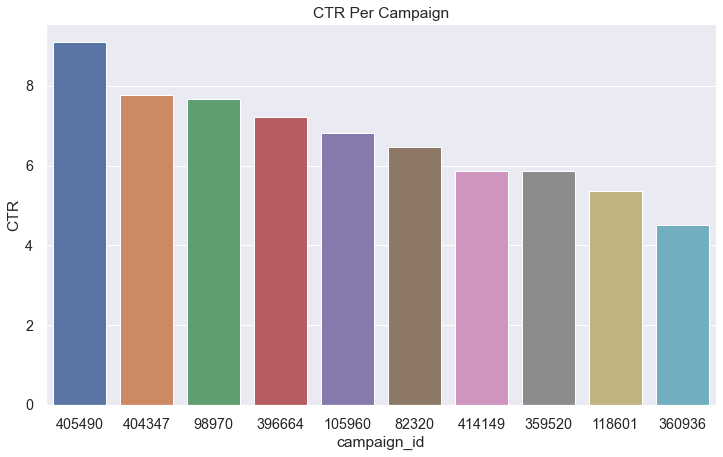

In [21]:
#plotting
plt.figure(figsize=(12,7))
sns.set(font_scale=1.3)
fig = sns.barplot(data=campaigns,x='campaign_id',y='CTR',order=campaigns['campaign_id']).set_title('CTR Per Campaign')
plt.show()

#### Conclusion

Best to Worst Campaigns (by CTR):

  Campaign ID, CTR


1. 405490, 9%
2. 404347, 7.7%
3. 98970, 7.6%
4. 396664, 7.2%
5. 105960, 6.8%
6. 82320, 6.4%
7. 414149, 5.8%
8. 359520, 5.8%
9. 118601, 5.3%
10. 360936, 4.5%

<br>
The Data from the top 5 campaigns should be studied further. (In addition to the data in this dataset we should check what was the content, creative text, etc)

In [22]:
campaigns_ids = campaigns.iloc[:5,0]
worst_campaigns_ids = campaigns.iloc[5:,0]

In [23]:
#getting best and worst campaigns by CTR
best_campaigns = ads.loc[ads['campaign_id'].isin(campaigns_ids)]
worst_campaigns = ads.loc[ads['campaign_id'].isin(worst_campaigns_ids)]

In [24]:
#best campaigns analysis
pdpr.ProfileReport(best_campaigns)

In [25]:
#worst campaigns analysis
pdpr.ProfileReport(worst_campaigns)

IndexError: index 3 is out of bounds for axis 0 with size 1

#### Conclusion

Comparison between best and worst campaigns characteristics teaches us that:

1. Both best and worst campaigns advertised: D,C,H,I. In the best E was also included and in the worst B was also included


2. The best campaigns were at the webpages: 60305,6970,53587,11085,51181


3. The worst campaigns were at the webpages: 45962,28529,13787,1734


4. Both best and worst campaigns targeted user group ids: 1,2,3,4. The best ones also targeted group 5, the worst also tegeted group 9


5. Both best and worst campaigns targeted age levels: 1,2,3,4,5

## Testing Hypothesis

In [26]:
#H0 - City Development Index in clicked ads are the same as in unclicked ads
#H1 - City Development Index in clicked ads differ from unclicked ads

city_dev_click = ads_click['city_development_index'].sample(3000) #I usded 3000 as i wanted at least 10% from the ads_clicked data

city_dev_no_click = ads_no_click['city_development_index'].sample(3000)

alpha = 0.05

print('Varience for prices of additional: ',np.var(city_dev_click))
print('Varience for prices of solo: ',np.var(city_dev_no_click))
print()
print('Standard deviation for prices of additional: ', np.std(city_dev_click))
print('Standard deviation for prices of solo: ',np.std(city_dev_no_click))
print()

results = st.mannwhitneyu(city_dev_click, city_dev_no_click)

print('p-value: ', results.pvalue)
print()
if (results.pvalue < alpha):
    print("Null hypothesis rejected: City Development Index in clicked ads differ from unclicked ads")
else:
    print("Failed to reject the null hypothesis: we can't make conclusions about the difference")

Varience for prices of additional:  0.853970524187656
Varience for prices of solo:  0.8416754207655265

Standard deviation for prices of additional:  0.9241052560112706
Standard deviation for prices of solo:  0.9174287006441026

p-value:  0.22330423445873504

Failed to reject the null hypothesis: we can't make conclusions about the difference


#### Conclusion

The Null hypothesis was rejected and we can't make conclusions about the difference between the City Development Index in clicked and unclicked ads

# Final Conclusion

1. We have 2 peaks at the number of users clicked, between 10:00 - 11:00 and between 19:00 - 20:00.
My hypothesis is that the peak in the morning hours is due to people having small breaks during the work/starting to get ready for their lunch.

    The peak in the evening hours might be because most people are at home by that time and have more free time (this hypothesis get a slight boost from the fact that between 15:00 - 17:00 we see a drop in the number of clicks as these are usually the hours that people start heading home from work and can not use technology with ads).

    At 21:00 There is another drop, this might be because people prefer to plug off or be with their family and friends after they have spend some time on their phones/comupters (19:00 - 20:00).



2. There is a small difference between the gender the click on ads. Males slightly tend to click more ads (15.99% VS 17.04%) 



3. There is diffrence in the number of clicks in each City Development level.<br> Best to Worst City Index:

    1. City Index 2
    2. City Index 3
    3. City Index 4
    4. City Index 1

  I suggest that we focus our marketing efforts on Cities in level 2 and then 3 of the Development Index as these may get us the best results.
  
  
4. Best to Worst Webpages by CTR:

     Webpage ID , CTR 

    1. 60305, 10%
    2. 53587, 8.4%
    3. 6970, 8.3%
    4. 51181, 7.7%
    5. 11085, 7.3%
    6. 1734, 6.8%
    7. 45962, 6.2%
    8. 13787, 5.7%
    9. 28529, 5.6%



<br>
    I suggest that we direct new and the most profitable customers to the top CTR webpages, in order to make them join us or preserve them as our customers.
    
5. Best to Worst Campaigns (by CTR):

 Campaign ID, CTR


1. 405490, 9%
2. 404347, 7.7%
3. 98970, 7.6%
4. 396664, 7.2%
5. 105960, 6.8%
6. 82320, 6.4%
7. 414149, 5.8%
8. 359520, 5.8%
9. 118601, 5.3%
10. 360936, 4.5%

<br>
The Data from the top 5 campaigns should be studied further. (In addition to the data in this dataset we should check what was the content, creative text, etc)

<br>

6. Comparison between best and worst campaigns characteristics teaches us that:

 1. Both best and worst campaigns advertised: D,C,H,I.<br>In the best E was also included and in the worst B was also included
 <br>
 2. The best campaigns were at the webpages: 60305, 6970, 53587, 11085, 51181
 <br>
 3. The worst campaigns were at the webpages: 45962, 28529, 13787, 1734
 <br>
 4. Both best and worst campaigns targeted user group ids: 1, 2, 3, 4. The best ones also targeted group 5, the worst also tegeted group 9
 <br>
 5. Both best and worst campaigns targeted age levels: 1, 2, 3, 4, 5
 
<br>
7. The Null hypothesis was rejected and we can't make conclusions about the difference between the City Development Index in clicked and unclicked ads